In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from scipy import stats

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score

This dataset contains 79 exploratory that describe residential homes in Ames, Iowa (USA) with the aim to predict the final price.

In [2]:
df_train = pd.read_csv("train.csv")
df_test = pd.read_csv("test.csv")

In [3]:
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [4]:
df_train.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


## Exploring the SalePrice

In [5]:
df_train["SalePrice"].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

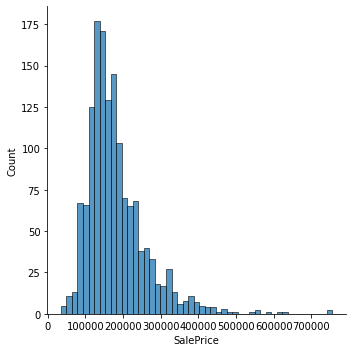

In [6]:
sns.displot(df_train["SalePrice"])

We can see that SalePrice closely deviates from a normal distribution, having a positive skewness

<AxesSubplot:>

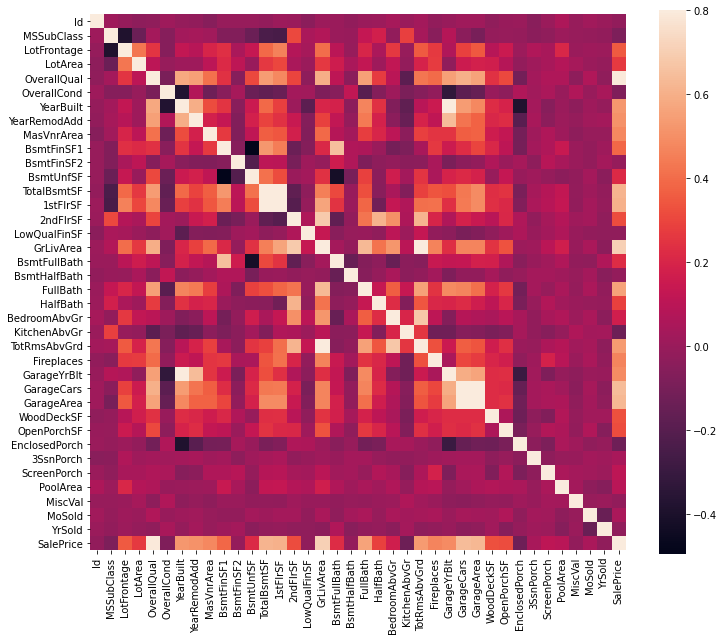

In [7]:
# building a correlation matrix

corr_matrix = df_train.corr()
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr_matrix, vmax=.8, square=True)

The closer to white a square is, the stronger the correlation between it and sale price (last column). Unsurprisingly maybe, *OverallQual* (OverallQual: Overall material and finish quality) has one of the strongest correlations to the sale price; closely followed by:
- *TotalBsmtSF*: Total square feet of basement area
- *1stFlrSF*: First Floor square feet
- *GrLivArea*: Above grade (ground) living area square feet

In [8]:
# zooming on the top 10

cols = corr_matrix.nlargest(10, "SalePrice")["SalePrice"].index
cols

Index(['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea',
       'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt'],
      dtype='object')

<AxesSubplot:>

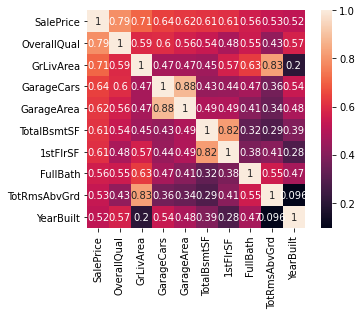

In [9]:
top_10_cols = np.corrcoef(df_train[cols].values.T)
sns.heatmap(top_10_cols, yticklabels=cols.values, xticklabels=cols.values, square=True, annot=True)

*GarageCars* and *GarageArea* are closely related variables, they logically describe the same thing. We can observe that their coeffcient is also almost the same. *TotRmsAbvGrd* and *GrLivArea* follow the same logic.

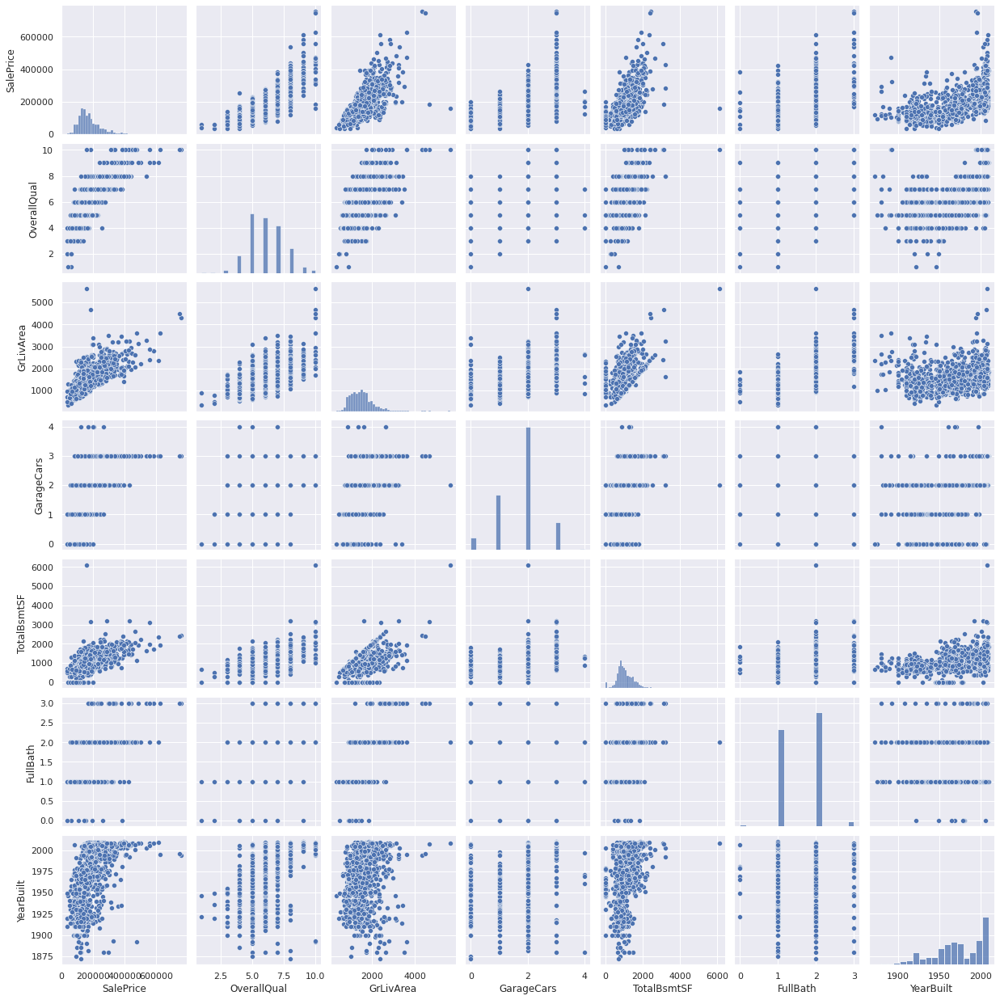

In [10]:
sns.set()
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 
        'TotalBsmtSF', 'FullBath', 'YearBuilt']
sns.pairplot(df_train[cols], size=2.5)

Some observations: 
- *TotalBsmtSF* and *GrLiveArea* almost have an upper bound, that's because the basement is usually less or equal in area to the ground level.
- *SalePrice* and *YearBuilt*, for recent years there seems to be an increase in the average house price

## Missing data

In [11]:
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
GarageCond,81,0.055479
GarageType,81,0.055479
GarageFinish,81,0.055479


Most of the variables that have high percentage of missing data can be seen as optional features when buying a house, thus they are not particularly important when making a decision. Variables that are related to garage can also be discarded because we already have *GarageCars*, same goes for basement.

For electrical field we can delete the missing entry.

In [12]:
eliminated_indexes = missing_data[missing_data['Total'] > 1].index.values
missing_data[missing_data['Total'] > 1].index.values

array(['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu',
       'LotFrontage', 'GarageYrBlt', 'GarageCond', 'GarageType',
       'GarageFinish', 'GarageQual', 'BsmtFinType2', 'BsmtExposure',
       'BsmtQual', 'BsmtCond', 'BsmtFinType1', 'MasVnrArea', 'MasVnrType'],
      dtype=object)

In [13]:
df_train = df_train.drop((missing_data[missing_data['Total'] > 1]).index, 1)
df_train = df_train.drop(df_train.loc[df_train['Electrical'].isnull()].index)
df_train.isnull().sum().max()

0

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:xlabel='GrLivArea', ylabel='SalePrice'>

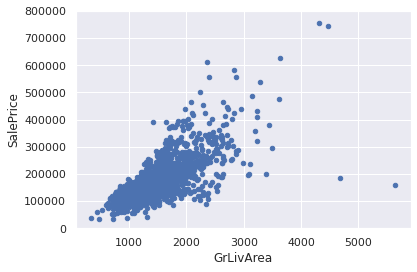

In [14]:
# checking for outliers

data = pd.concat([df_train['SalePrice'], df_train["GrLivArea"]], axis=1)
data.plot.scatter(x="GrLivArea", y='SalePrice', ylim=(0,800000))

The two rightmost points (large living area and low sale price) could refer to some rural houses with lots of land and lower value. The two points at the top seem to follow the trend, probably some mansions with lots of land.

In [15]:
# deleting points
df_train.sort_values(by = 'GrLivArea', ascending = False)[:2]
df_train = df_train.drop(df_train[df_train['Id'] == 1299].index)
df_train = df_train.drop(df_train[df_train['Id'] == 524].index)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:xlabel='TotalBsmtSF', ylabel='SalePrice'>

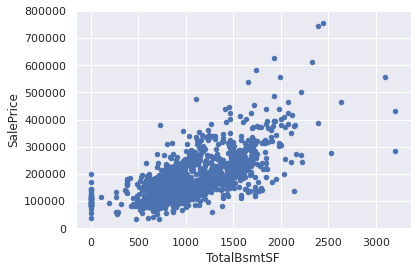

In [16]:
data = pd.concat([df_train['SalePrice'], df_train["TotalBsmtSF"]], axis=1)
data.plot.scatter(x="TotalBsmtSF", y='SalePrice', ylim=(0,800000))

## Normalization

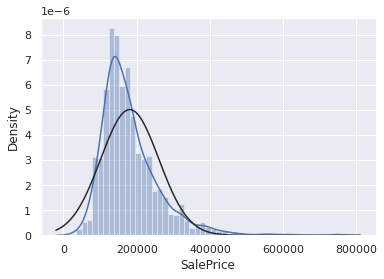

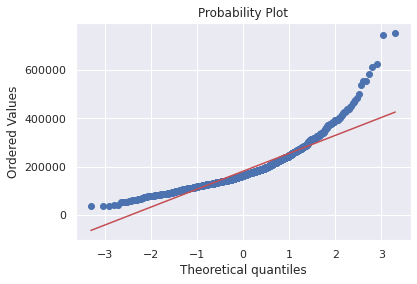

In [17]:
sns.distplot(df_train['SalePrice'], fit=stats.norm)
fig = plt.figure()
res = stats.probplot(df_train['SalePrice'], plot=plt)

Performing a log transformation in order to normalize the data

In [18]:
df_train['SalePrice'] = np.log(df_train['SalePrice'])

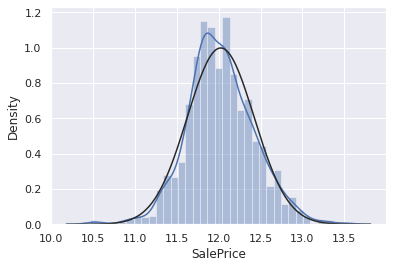

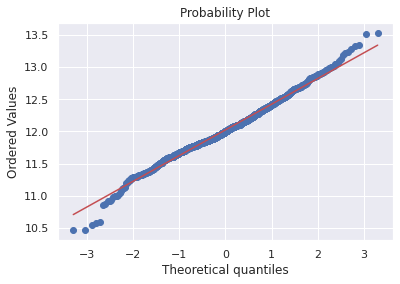

In [19]:
sns.distplot(df_train['SalePrice'], fit=stats.norm)
fig = plt.figure()
res = stats.probplot(df_train['SalePrice'], plot=plt)

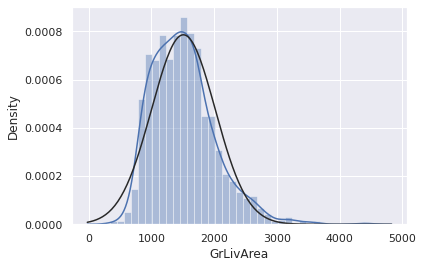

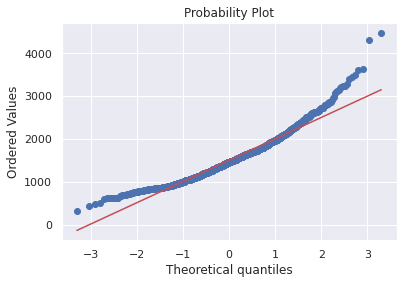

In [20]:
sns.distplot(df_train['GrLivArea'], fit=stats.norm)
fig = plt.figure()
res = stats.probplot(df_train['GrLivArea'], plot=plt)

In [21]:
df_train['GrLivArea'] = np.log(df_train['GrLivArea'])

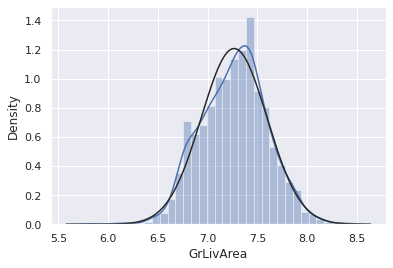

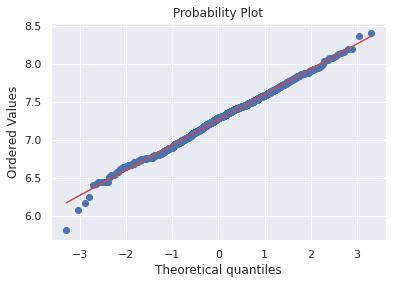

In [22]:
sns.distplot(df_train['GrLivArea'], fit=stats.norm)
fig = plt.figure()
res = stats.probplot(df_train['GrLivArea'], plot=plt)

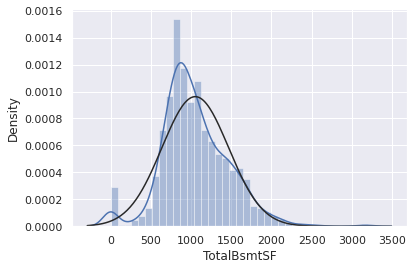

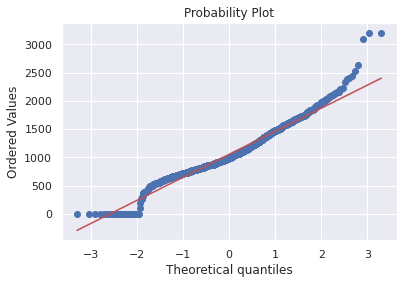

In [23]:
sns.distplot(df_train['TotalBsmtSF'], fit=stats.norm)
fig = plt.figure()
res = stats.probplot(df_train['TotalBsmtSF'], plot=plt)

*TotalBsmtSF* presents additional challenges because we have a lot of zero values (houses with no basement).
We will try to perform a log transformation on the non-zero values.

In [24]:
df_train['HasBsmt'] = pd.Series(len(df_train['TotalBsmtSF']), index=df_train.index)
df_train['HasBsmt'] = 0 
df_train.loc[df_train['TotalBsmtSF']>0,'HasBsmt'] = 1

In [25]:
df_train.loc[df_train['HasBsmt']==1,'TotalBsmtSF'] = np.log(df_train['TotalBsmtSF'])

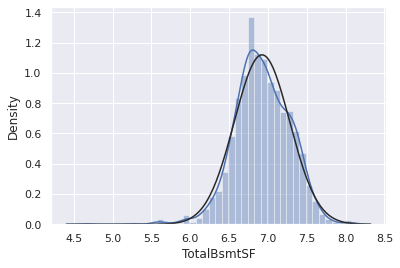

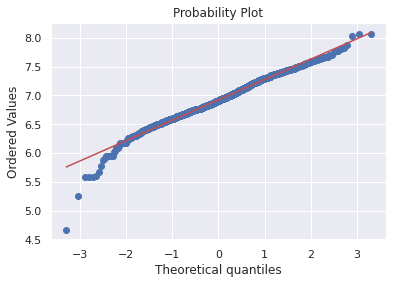

In [26]:
sns.distplot(df_train[df_train['TotalBsmtSF']>0]['TotalBsmtSF'], fit=stats.norm)
fig = plt.figure()
res = stats.probplot(df_train[df_train['TotalBsmtSF']>0]['TotalBsmtSF'], plot=plt)

## Homoscedasticity

Homoscedasticity refers to the assumption that dependent variable(s) exhibit equal levels of variance across the range of predictor variable(s)

a.k.a.

Any time we can’t confidently draw a line through our data and know that we got within range of most of the values

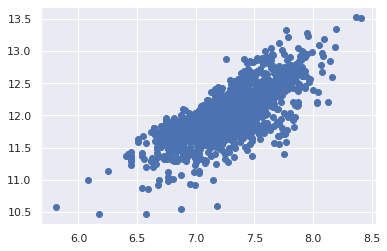

In [27]:
plt.scatter(df_train['GrLivArea'], df_train['SalePrice'])

If we compare to the scatter plot before our transformations, we can see that we lost the "cone" shape of the data.
By solving the normality problem we also solved homoscedasticity problem.

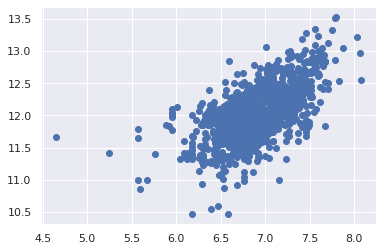

In [28]:
plt.scatter(df_train[df_train['TotalBsmtSF']>0]['TotalBsmtSF'], df_train[df_train['TotalBsmtSF']>0]['SalePrice'])

In [29]:
# transform categorical variables to dummies
df_train = pd.get_dummies(df_train)

In [30]:
df_train.head(10)

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1,60,8450,7,5,2003,2003,706,0,150,...,0,0,0,1,0,0,0,0,1,0
1,2,20,9600,6,8,1976,1976,978,0,284,...,0,0,0,1,0,0,0,0,1,0
2,3,60,11250,7,5,2001,2002,486,0,434,...,0,0,0,1,0,0,0,0,1,0
3,4,70,9550,7,5,1915,1970,216,0,540,...,0,0,0,1,1,0,0,0,0,0
4,5,60,14260,8,5,2000,2000,655,0,490,...,0,0,0,1,0,0,0,0,1,0
5,6,50,14115,5,5,1993,1995,732,0,64,...,0,0,0,1,0,0,0,0,1,0
6,7,20,10084,8,5,2004,2005,1369,0,317,...,0,0,0,1,0,0,0,0,1,0
7,8,60,10382,7,6,1973,1973,859,32,216,...,0,0,0,1,0,0,0,0,1,0
8,9,50,6120,7,5,1931,1950,0,0,952,...,0,0,0,1,1,0,0,0,0,0
9,10,190,7420,5,6,1939,1950,851,0,140,...,0,0,0,1,0,0,0,0,1,0


## Doing similar transformations for the test data

In [31]:
total_testdf = df_test.isnull().sum().sort_values(ascending=False)
percent_testdf = (df_test.isnull().sum()/df_test.isnull().count()).sort_values(ascending=False)
missing_data_testdf = pd.concat([total_testdf, percent_testdf], axis=1, keys=['Total', 'Percent'])
missing_data_testdf.head(35)

,Total,Percent
PoolQC,1456,0.997944
MiscFeature,1408,0.965045
Alley,1352,0.926662
Fence,1169,0.801234
FireplaceQu,730,0.500343
LotFrontage,227,0.155586
GarageYrBlt,78,0.053461
GarageQual,78,0.053461
GarageFinish,78,0.053461
GarageCond,78,0.053461


In [32]:
eliminated_indexes_testdf = missing_data_testdf[missing_data_testdf['Total'] > 1].index.values
missing_data_testdf[missing_data_testdf['Total'] > 1].index.values

array(['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu',
       'LotFrontage', 'GarageYrBlt', 'GarageQual', 'GarageFinish',
       'GarageCond', 'GarageType', 'BsmtCond', 'BsmtQual', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'MasVnrType', 'MasVnrArea',
       'MSZoning', 'BsmtHalfBath', 'Utilities', 'Functional',
       'BsmtFullBath'], dtype=object)

In [33]:
eliminated_indexes

array(['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu',
       'LotFrontage', 'GarageYrBlt', 'GarageCond', 'GarageType',
       'GarageFinish', 'GarageQual', 'BsmtFinType2', 'BsmtExposure',
       'BsmtQual', 'BsmtCond', 'BsmtFinType1', 'MasVnrArea', 'MasVnrType'],
      dtype=object)

In [34]:
remove_nulls = []
for index in eliminated_indexes_testdf:
    if index not in eliminated_indexes:
        print(index)
        remove_nulls.append(index)
    else:
        print(f"Index {index} is missing in both")

Index PoolQC is missing in both
Index MiscFeature is missing in both
Index Alley is missing in both
Index Fence is missing in both
Index FireplaceQu is missing in both
Index LotFrontage is missing in both
Index GarageYrBlt is missing in both
Index GarageQual is missing in both
Index GarageFinish is missing in both
Index GarageCond is missing in both
Index GarageType is missing in both
Index BsmtCond is missing in both
Index BsmtQual is missing in both
Index BsmtExposure is missing in both
Index BsmtFinType1 is missing in both
Index BsmtFinType2 is missing in both
Index MasVnrType is missing in both
Index MasVnrArea is missing in both
MSZoning
BsmtHalfBath
Utilities
Functional
BsmtFullBath


Test data seems to have all the same variables missing percentages, we will just remove them as well. For the variables with only a few missing values, we will delete those entries.

In [35]:
df_test = df_test.drop((missing_data_testdf[missing_data_testdf['Total'] > 10]).index, 1)
df_test = df_test.dropna()

In [36]:
df_test['GrLivArea'] = np.log(df_test['GrLivArea'])
df_test['HasBsmt'] = pd.Series(len(df_test['TotalBsmtSF']), index=df_test.index)
df_test['HasBsmt'] = 0 
df_test.loc[df_test['TotalBsmtSF']>0, 'HasBsmt'] = 1
df_test.loc[df_test['HasBsmt']==1, 'TotalBsmtSF'] = np.log(df_test['TotalBsmtSF'])
df_test = pd.get_dummies(df_test)


In [37]:
df_train.shape, df_test.shape

((1457, 222), (1447, 206))

In [38]:
df_test.head(5)

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1461,20,11622,5,6,1961,1961,468.0,144.0,270.0,...,0,0,0,1,0,0,0,0,1,0
1,1462,20,14267,6,6,1958,1958,923.0,0.0,406.0,...,0,0,0,1,0,0,0,0,1,0
2,1463,60,13830,5,5,1997,1998,791.0,0.0,137.0,...,0,0,0,1,0,0,0,0,1,0
3,1464,60,9978,6,6,1998,1998,602.0,0.0,324.0,...,0,0,0,1,0,0,0,0,1,0
4,1465,120,5005,8,5,1992,1992,263.0,0.0,1017.0,...,0,0,0,1,0,0,0,0,1,0


In [39]:
final_train, final_test = df_train.align(df_test, join="left", axis=1)
final_train = final_train.fillna(final_train.mean())
final_test = final_test.fillna(final_train.mean())

In [40]:
final_train.shape, final_test.shape

((1457, 222), (1447, 222))

In [41]:
final_train_nosp = final_train.drop(columns="SalePrice")
saleprice = final_train["SalePrice"]

final_test = final_test.drop(columns="SalePrice")

In [42]:
def measure_performance(y, y_pred, model):
    r2 = r2_score(y, y_pred)
    mse = mean_squared_error(y, y_pred)
    print(f"MSE={mse:.4f} and R^2={r2:.4f} scored by {model}")

In [43]:
LR_model = LinearRegression().fit(final_train_nosp, saleprice)
y_pred_LR = LR_model.predict(final_train_nosp)
measure_performance(saleprice, y_pred_LR, "LinearRegression")

DTR_model = DecisionTreeRegressor().fit(final_train_nosp, saleprice)
y_pred_DTR = DTR_model.predict(final_train_nosp)
measure_performance(saleprice, y_pred_DTR, "DecisionTreeRegressor")

SVR_model = SVR().fit(final_train_nosp, saleprice)
y_pred_SVR = SVR_model.predict(final_train_nosp)
measure_performance(saleprice, y_pred_SVR, "SVR")

KNR_model = KNeighborsRegressor().fit(final_train_nosp, saleprice)
y_pred_KNR = KNR_model.predict(final_train_nosp)
measure_performance(saleprice, y_pred_KNR, "KNeighborsRegressor")


MSE=0.0087 and R^2=0.9456 scored by LinearRegression
MSE=0.0000 and R^2=1.0000 scored by DecisionTreeRegressor
MSE=0.0410 and R^2=0.7437 scored by SVR
MSE=0.0379 and R^2=0.7629 scored by KNeighborsRegressor


Although DecisionTreeRegressor obtained the best scores, it can be due to overfitting of our data.

We should have used OneHotEncoder instead of encoding the labels as integers in order to obtain accurate scores for the DecisionTreeRegressor.

https://stackoverflow.com/questions/38108832/passing-categorical-data-to-sklearn-decision-tree


In [44]:
y_pred = np.exp(LR_model.predict(final_test))

solution = pd.DataFrame({"Id": final_test["Id"], "SalePrice": y_pred})
solution.head()

,Id,SalePrice
0,1461,116987.728817
1,1462,157066.716032
2,1463,183235.360053
3,1464,198585.750343
4,1465,201917.337254


In [45]:
solution.shape

(1447, 2)

Possible improvements:
- applying log transformations to all features that present skewness
- using regularized linear model sridge/lasso

In [46]:
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

combined_data =  pd.concat((train.loc[:,'MSSubClass':'SaleCondition'],
                      test.loc[:,'MSSubClass':'SaleCondition']))
# we ignore Id (and SalePrice for train) 

In [47]:
train["SalePrice"] = np.log1p(train["SalePrice"])

# select numerics
numeric_feats = combined_data.dtypes[combined_data.dtypes != "object"].index

# compute skewness for numerics
skewed_feats = train[numeric_feats].apply(lambda x: stats.skew(x.dropna()))
skewed_feats = skewed_feats[skewed_feats > 0.75]
skewed_feats = skewed_feats.index

# apply a logarithm for all skewed numeric features
combined_data[skewed_feats] = np.log1p(combined_data[skewed_feats])

In [48]:
# obtain the dummies for all categorical features
combined_data = pd.get_dummies(combined_data)

In [49]:
# fill NA values with the mean
combined_data = combined_data.fillna(combined_data.mean())

In [50]:
X_train = combined_data[:train.shape[0]]
X_test = combined_data[train.shape[0]:]
y = train.SalePrice

In [51]:
from sklearn.linear_model import RidgeCV, LassoCV


In [52]:
Ridge_model = RidgeCV(alphas= [0.05, 0.1, 0.3, 1, 3, 5, 10, 15, 30, 50, 75]).fit(X_train, y)

In [53]:
measure_performance(y, Ridge_model.predict(X_train), "Ridge_model")

MSE=0.0112 and R^2=0.9300 scored by Ridge_model


In [54]:
Lasso_model = LassoCV(alphas = [1, 0.1, 0.001, 0.0005]).fit(X_train, y)

In [55]:
measure_performance(y, Lasso_model.predict(X_train), "Lasso_model")

MSE=0.0110 and R^2=0.9308 scored by Lasso_model


Lasso picked 110 variables and eliminated the other 178 variables


Text(0.5, 1.0, 'Coefficients in the Lasso Model')

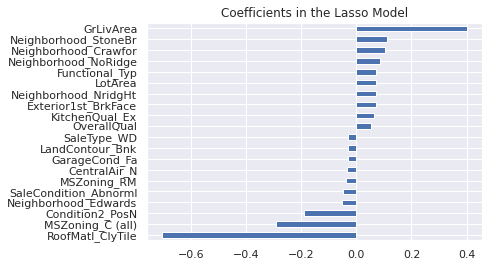

In [59]:
coefs_lasso = pd.Series(Lasso_model.coef_, index = X_train.columns)
print("Lasso picked " + str(sum(coefs_lasso != 0)) + " variables and eliminated the other " +  str(sum(coefs_lasso == 0)) + " variables")
top_low_lasso = pd.concat([coefs_lasso.sort_values().head(10),
                     coefs_lasso.sort_values().tail(10)])
top_low_lasso.plot(kind = "barh")
plt.title("Coefficients in the Lasso Model")

# plottig top 10 best and worst coefs picked by lasso regressor

*GrLivArea* was considered one of the most important factors, which makes sense considering our previous explorations. Next few predictors represent locations and quality features of the home.

LassoCV model outperformed RidgeCV, but based on MSE and R^2 scores, it it's still below what we obtained with the simple LinearRegression model.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


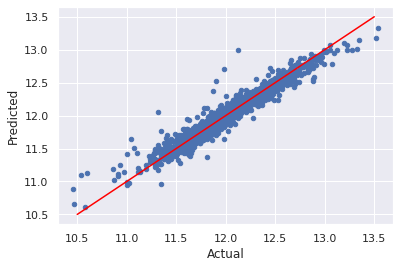

In [57]:
# plotting our lasso prediction

predict = pd.DataFrame({"Actual": y, "Predicted": Lasso_model.predict(X_train)})
predict.plot(x = "Actual", y = "Predicted", kind = "scatter", use_index=True)

plt.plot([10.5, 13.5], [10.5, 13.5], c = "red")
plt.show()